In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist
from pandas import DataFrame
from sklearn import metrics
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.cluster import SpectralClustering, DBSCAN, KMeans
from sklearn.metrics import adjusted_rand_score
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import math

## Data Processing

In [2]:
country_info_path = "../data/country_info.csv"
artists_similarity_path = "../data/jaccard_normalized_artists_similarity.csv"
genres_similarity_path = "../data/jaccard_normalized_genres_similarity.csv"
votes_path = "../data/votes.csv"

country_info_df = pd.read_csv(country_info_path)

artists_similarity_df = pd.read_csv(artists_similarity_path)
artists_similarity_array = np.array(artists_similarity_df)
artists_similarity_matrix = artists_similarity_array[:, 1:].tolist()

genres_similarity_df = pd.read_csv(genres_similarity_path)
genres_similarity_array = np.array(genres_similarity_df)
genres_similarity_matrix = genres_similarity_array[:, 1:].tolist()

country_code_list = genres_similarity_df['country'].tolist()
map_code_to_idx = {code: idx for idx, code in enumerate(country_code_list)}
country_num = len(country_code_list)

votes_df = pd.read_csv(votes_path)
votes_array = np.array(votes_df) 
votes_list = votes_array.tolist()  

votes_matrix_total = [[0 for i in range(country_num)] for j in range(country_num)]
votes_matrix_jury = [[0 for i in range(country_num)] for j in range(country_num)]
votes_matrix_tele = [[0 for i in range(country_num)] for j in range(country_num)]

for vote in votes_list:
    # if vote[0] != 2023 or vote[1] != 'final':  # only consider 2023, final and total points
    # continue
    from_country_code, to_country_code, total_points = vote[2], vote[3], vote[-3]
    if from_country_code not in country_code_list or to_country_code not in country_code_list:
        continue
    votes_matrix_total[map_code_to_idx[from_country_code]][map_code_to_idx[to_country_code]] += total_points
    if not math.isnan(vote[-2]):
        votes_matrix_tele[map_code_to_idx[from_country_code]][map_code_to_idx[to_country_code]] += vote[-2]
    if not math.isnan(vote[-1]):
        votes_matrix_jury[map_code_to_idx[from_country_code]][map_code_to_idx[to_country_code]] += vote[-1]

## Clustering

Same as clustering_distance.ipynb

In [10]:
def clustering_one_and_visualize_by_pca(D, V, num_clusters, method='KMeans'):
    # Preprocess data: Impute missing values and normalize
    imputer = SimpleImputer(strategy='mean')
    scaler = StandardScaler()
    
    D_imputed = imputer.fit_transform(D)
    V_imputed = imputer.transform(V)  # Use the same transformation for V
    
    D_scaled = scaler.fit_transform(D_imputed)
    V_scaled = scaler.transform(V_imputed)  # Use the same transformation for V

    # Clustering
    if method == 'KMeans':
        clustering = KMeans(n_clusters=num_clusters, random_state=42)
    elif method == 'SpectralClustering':
        clustering = SpectralClustering(n_clusters=num_clusters, random_state=42, assign_labels="discretize")
    
    labels = clustering.fit_predict(D_scaled)  # Only fit on D

    # Random labels for comparison
    random_labels = np.random.randint(num_clusters, size=len(D))

    # PCA Dimensionality Reduction
    pca = PCA(n_components=2)
    D_pca = pca.fit_transform(D_scaled)
    V_pca = pca.transform(V_scaled)  # Use the same PCA transformation for V

    # Visualization of original clustering
    plt.figure(figsize=(24, 12))

    plt.subplot(2, 2, 1)
    for cluster in range(num_clusters):
        cluster_points = D_pca[labels == cluster]
        plt.scatter(cluster_points[:, 0], cluster_points[:, 1], s=96, label=f'Cluster {cluster}')
    plt.title('PCA Visualization of Music Taste Matrix (Original Clustering)', fontsize=24)
    plt.xlabel('Principal Component 1', fontsize=16)
    plt.ylabel('Principal Component 2', fontsize=16)
    plt.legend()

    plt.subplot(2, 2, 2)
    for cluster in range(num_clusters):
        cluster_points = V_pca[labels == cluster]
        plt.scatter(cluster_points[:, 0], cluster_points[:, 1], s=96, label=f'Cluster {cluster}')
    plt.title('PCA Visualization of Voting Matrix (Original Clustering)', fontsize=24)
    plt.xlabel('Principal Component 1', fontsize=16)
    plt.ylabel('Principal Component 2', fontsize=16)
    plt.legend()

    # Visualization of random clustering
    plt.subplot(2, 2, 3)
    for cluster in range(num_clusters):
        cluster_points = D_pca[random_labels == cluster]
        plt.scatter(cluster_points[:, 0], cluster_points[:, 1], s=96, label=f'Cluster {cluster}')
    plt.title('PCA Visualization of Music Taste Matrix (Random Clustering)', fontsize=24)
    plt.xlabel('Principal Component 1', fontsize=16)
    plt.ylabel('Principal Component 2', fontsize=16)
    plt.legend()

    plt.subplot(2, 2, 4)
    for cluster in range(num_clusters):
        cluster_points = V_pca[random_labels == cluster]
        plt.scatter(cluster_points[:, 0], cluster_points[:, 1], s=96, label=f'Cluster {cluster}')
    plt.title('PCA Visualization of Voting Matrix (Random Clustering)', fontsize=24)
    plt.xlabel('Principal Component 1', fontsize=16)
    plt.ylabel('Principal Component 2', fontsize=16)
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Evaluation
    silhouette_score_D = silhouette_score(D_scaled, labels)
    silhouette_score_V = silhouette_score(V_scaled, labels)
    silhouette_score_D_random = silhouette_score(D_scaled, random_labels)
    silhouette_score_V_random = silhouette_score(V_scaled, random_labels)

    print(f"The silhouette score for Distance Matrix (Original) is: {silhouette_score_D}")
    print(f"The silhouette score for Voting Matrix (Original) is: {silhouette_score_V}")
    print(f"The silhouette score for Distance Matrix data (Random) is: {silhouette_score_D_random}")
    print(f"The silhouette score for Voting Matrix data (Random) is: {silhouette_score_V_random}")

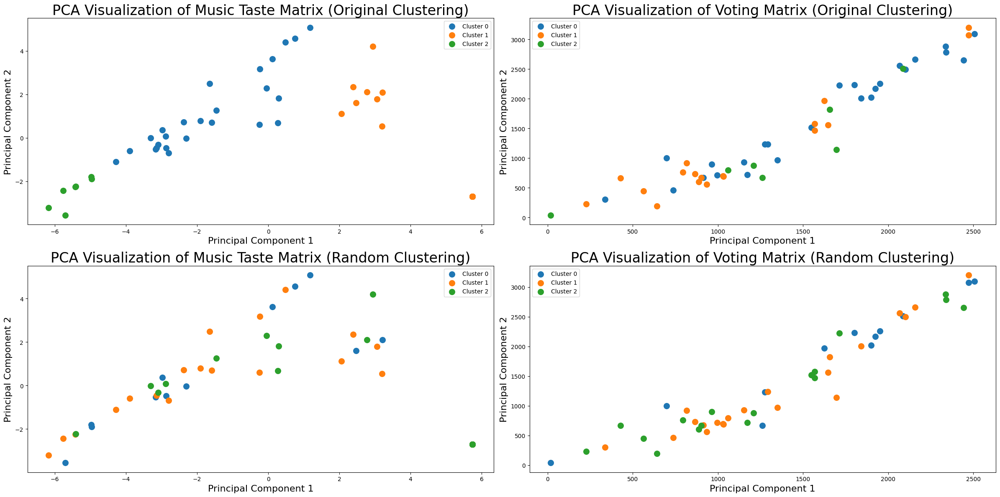

The silhouette score for Distance Matrix (Original) is: 0.21094828288866002
The silhouette score for Voting Matrix (Original) is: -0.025146430745463313
The silhouette score for Distance Matrix data (Random) is: -0.0018225638371807097
The silhouette score for Voting Matrix data (Random) is: -0.03564695441839469


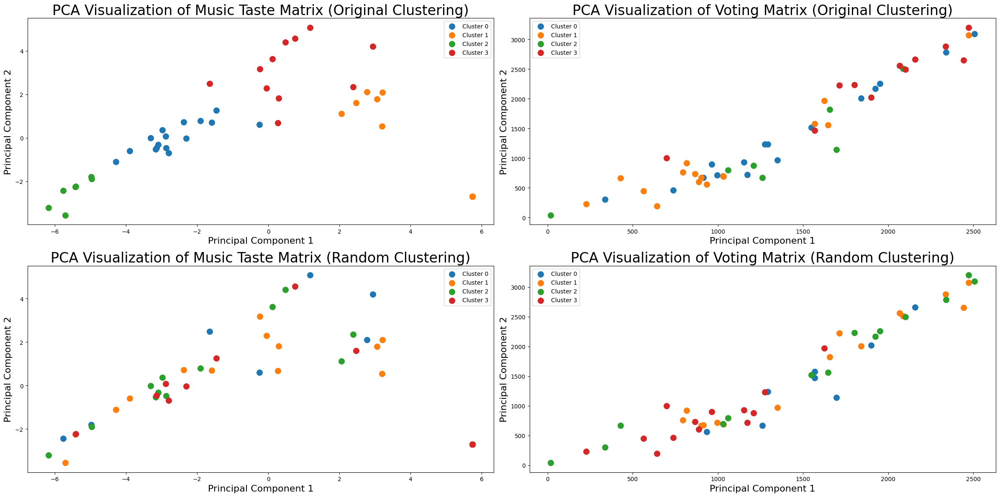

The silhouette score for Distance Matrix (Original) is: 0.20535540597417973
The silhouette score for Voting Matrix (Original) is: -0.02120503010800269
The silhouette score for Distance Matrix data (Random) is: -0.04034692744964269
The silhouette score for Voting Matrix data (Random) is: -0.04245821875767303


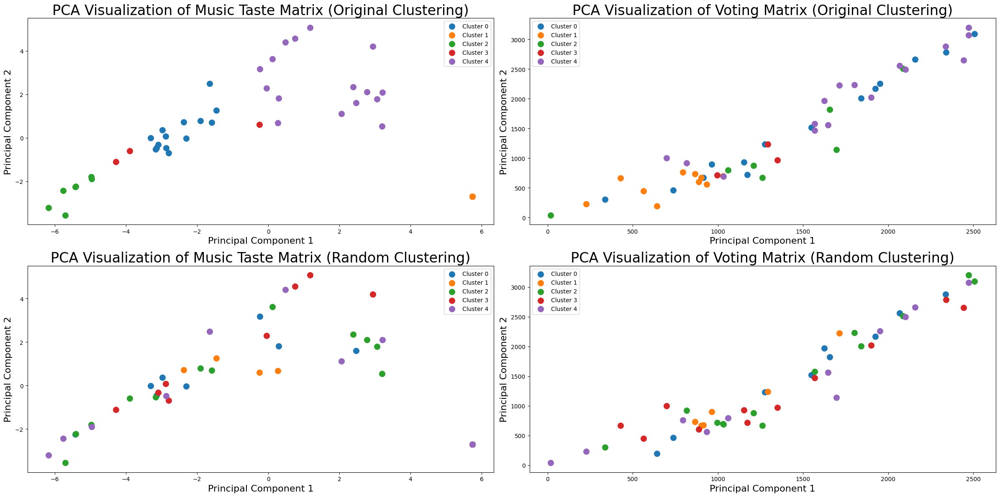

The silhouette score for Distance Matrix (Original) is: 0.28333725746742755
The silhouette score for Voting Matrix (Original) is: -0.09205342804963382
The silhouette score for Distance Matrix data (Random) is: -0.07961039416785148
The silhouette score for Voting Matrix data (Random) is: -0.1237779736621383


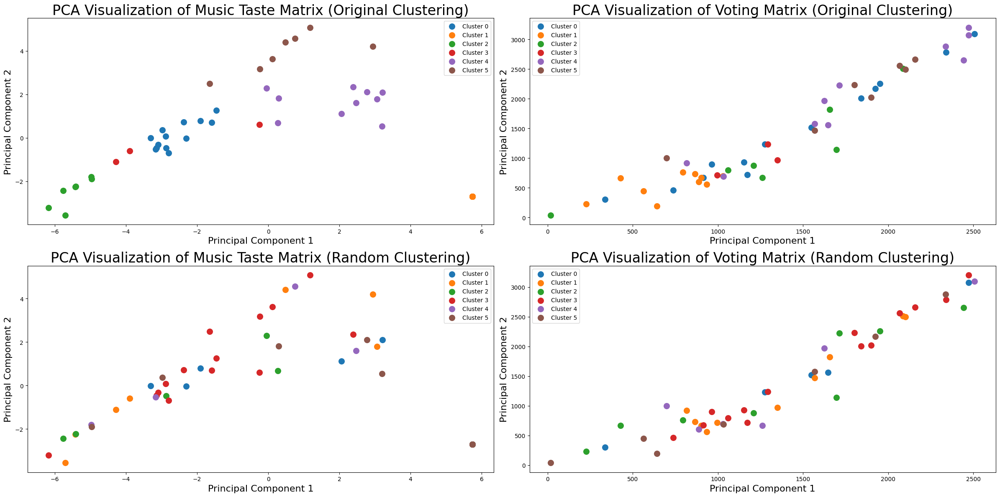

The silhouette score for Distance Matrix (Original) is: 0.29892921037985626
The silhouette score for Voting Matrix (Original) is: -0.09529556279791418
The silhouette score for Distance Matrix data (Random) is: -0.08121897319333568
The silhouette score for Voting Matrix data (Random) is: -0.08521505776272215


/Users/keyu/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_spectral.py:703: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(


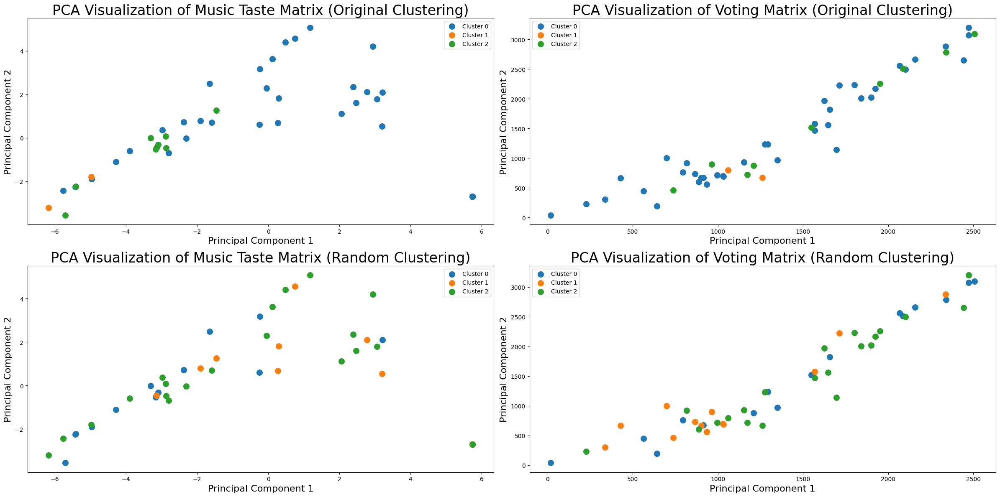

The silhouette score for Distance Matrix (Original) is: 0.13173443250188635
The silhouette score for Voting Matrix (Original) is: -0.16558059922769658
The silhouette score for Distance Matrix data (Random) is: -0.030251182696652164
The silhouette score for Voting Matrix data (Random) is: -0.04478360539082434


/Users/keyu/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_spectral.py:703: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(


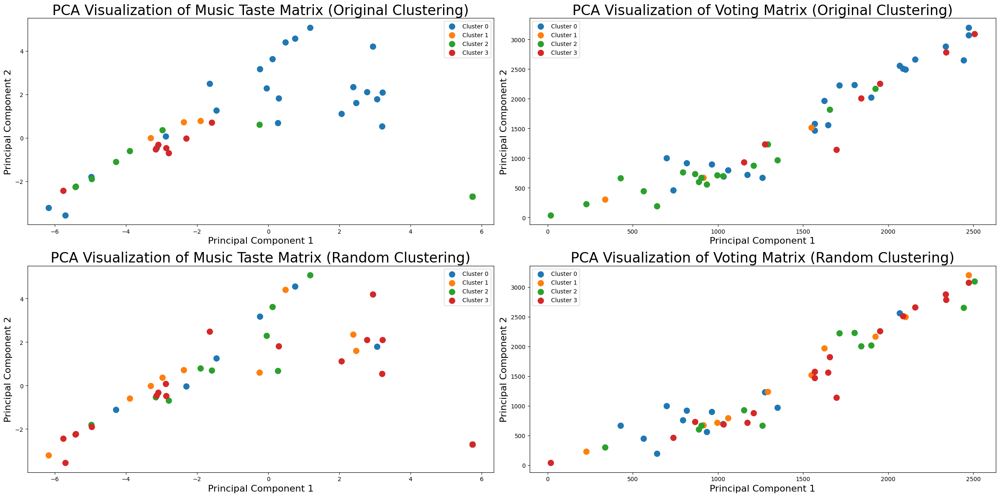

The silhouette score for Distance Matrix (Original) is: 0.12063505058643022
The silhouette score for Voting Matrix (Original) is: -0.1164050126708093
The silhouette score for Distance Matrix data (Random) is: -0.03487200097828345
The silhouette score for Voting Matrix data (Random) is: -0.06320069364188309


/Users/keyu/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_spectral.py:703: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(


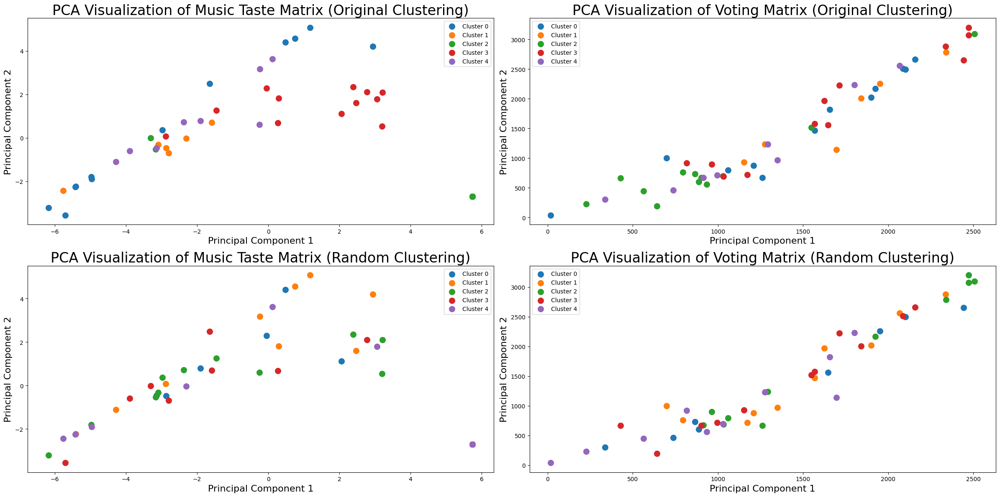

The silhouette score for Distance Matrix (Original) is: 0.1682656793828942
The silhouette score for Voting Matrix (Original) is: -0.06750355346003925
The silhouette score for Distance Matrix data (Random) is: -0.0652761482748935
The silhouette score for Voting Matrix data (Random) is: -0.06616082185824446


/Users/keyu/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_spectral.py:703: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(


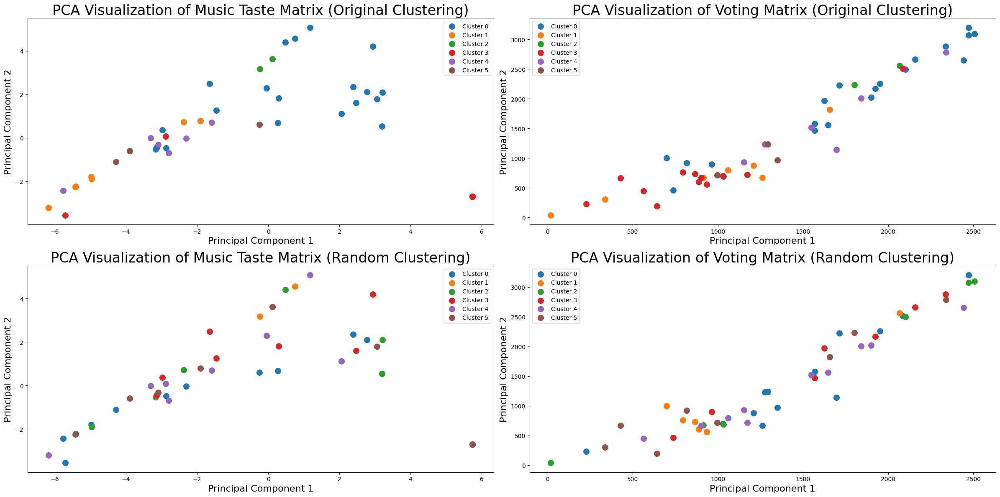

The silhouette score for Distance Matrix (Original) is: 0.19511085690248017
The silhouette score for Voting Matrix (Original) is: -0.13300329563359273
The silhouette score for Distance Matrix data (Random) is: -0.09799466484630298
The silhouette score for Voting Matrix data (Random) is: -0.1049389328895673


In [11]:
clustering_one_and_visualize_by_pca(artists_similarity_matrix, votes_matrix_total, 3, method='KMeans')
clustering_one_and_visualize_by_pca(artists_similarity_matrix, votes_matrix_total, 4, method='KMeans')
clustering_one_and_visualize_by_pca(artists_similarity_matrix, votes_matrix_total, 5, method='KMeans')
clustering_one_and_visualize_by_pca(artists_similarity_matrix, votes_matrix_total, 6, method='KMeans')

clustering_one_and_visualize_by_pca(artists_similarity_matrix, votes_matrix_total, 3, method='SpectralClustering')
clustering_one_and_visualize_by_pca(artists_similarity_matrix, votes_matrix_total, 4, method='SpectralClustering')
clustering_one_and_visualize_by_pca(artists_similarity_matrix, votes_matrix_total, 5, method='SpectralClustering')
clustering_one_and_visualize_by_pca(artists_similarity_matrix, votes_matrix_total, 6, method='SpectralClustering')

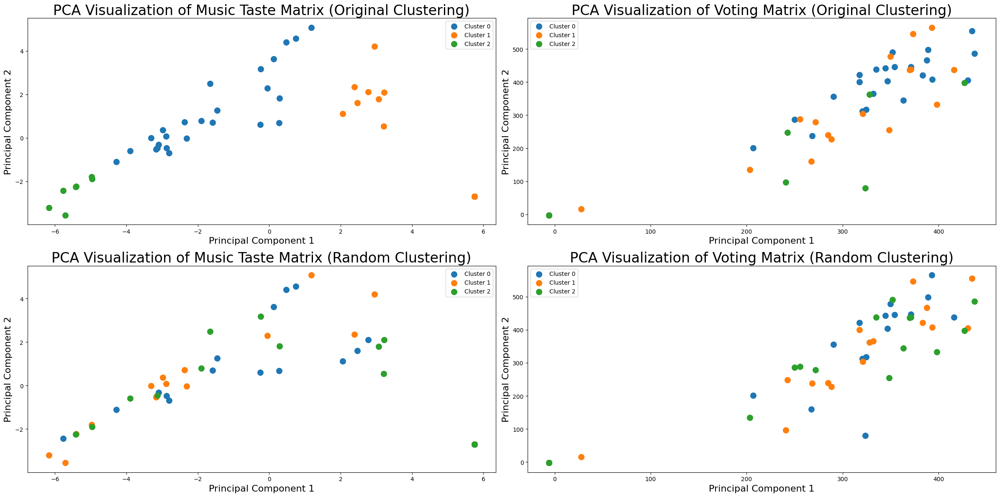

The silhouette score for Distance Matrix (Original) is: 0.21094828288866002
The silhouette score for Voting Matrix (Original) is: -0.023570583636715013
The silhouette score for Distance Matrix data (Random) is: -0.03128405262455536
The silhouette score for Voting Matrix data (Random) is: -0.026593036168766376


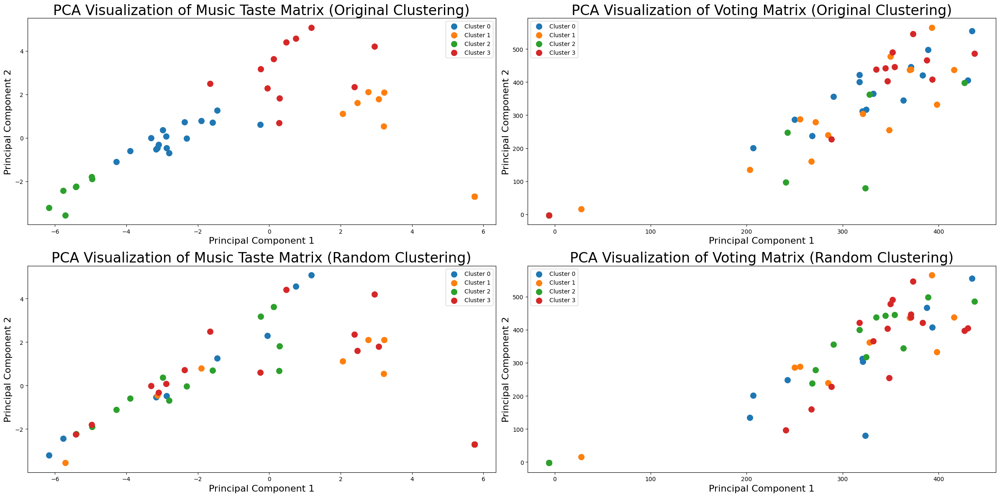

The silhouette score for Distance Matrix (Original) is: 0.20535540597417973
The silhouette score for Voting Matrix (Original) is: -0.045571566240683516
The silhouette score for Distance Matrix data (Random) is: -0.05458009947107761
The silhouette score for Voting Matrix data (Random) is: -0.032494565489243676


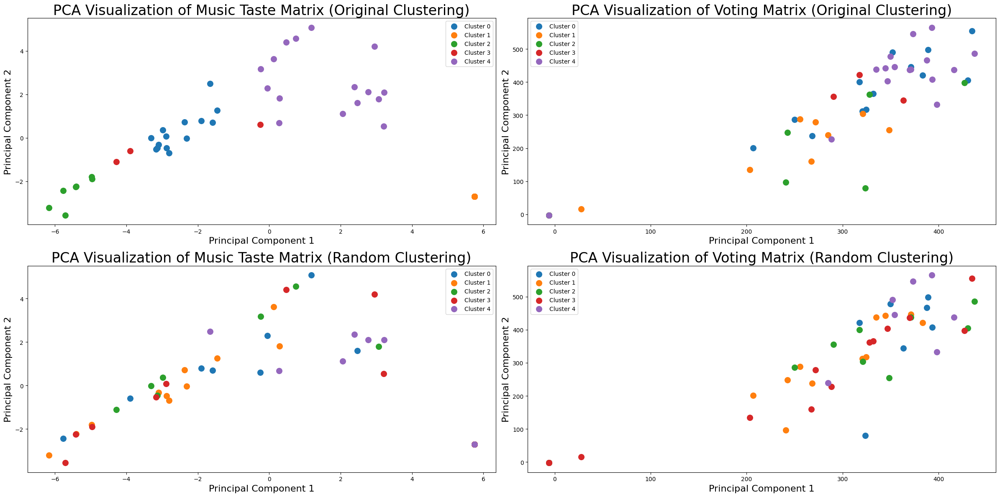

The silhouette score for Distance Matrix (Original) is: 0.28333725746742755
The silhouette score for Voting Matrix (Original) is: -0.09212067021647727
The silhouette score for Distance Matrix data (Random) is: -0.07318701300481688
The silhouette score for Voting Matrix data (Random) is: -0.07412085172470975


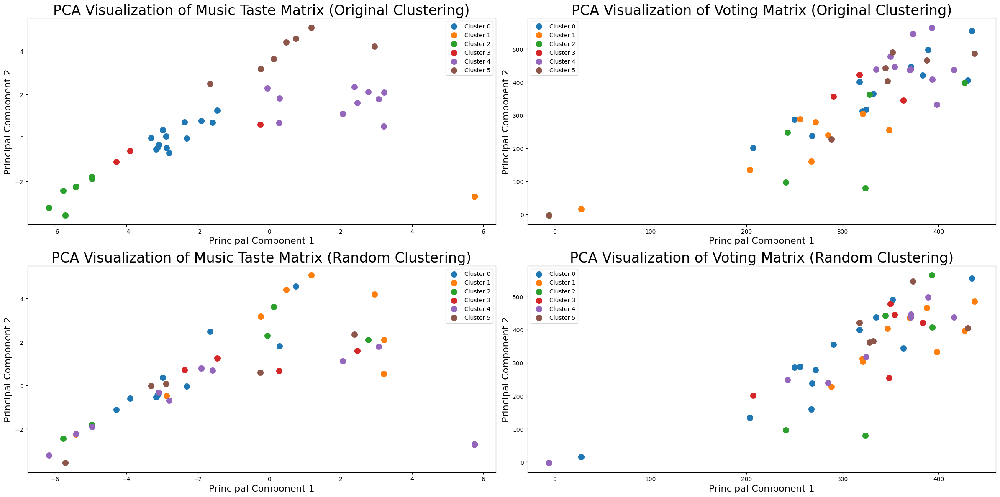

The silhouette score for Distance Matrix (Original) is: 0.29892921037985626
The silhouette score for Voting Matrix (Original) is: -0.09825592931565341
The silhouette score for Distance Matrix data (Random) is: -0.0936606100523589
The silhouette score for Voting Matrix data (Random) is: -0.08387775842644997


/Users/keyu/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_spectral.py:703: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(


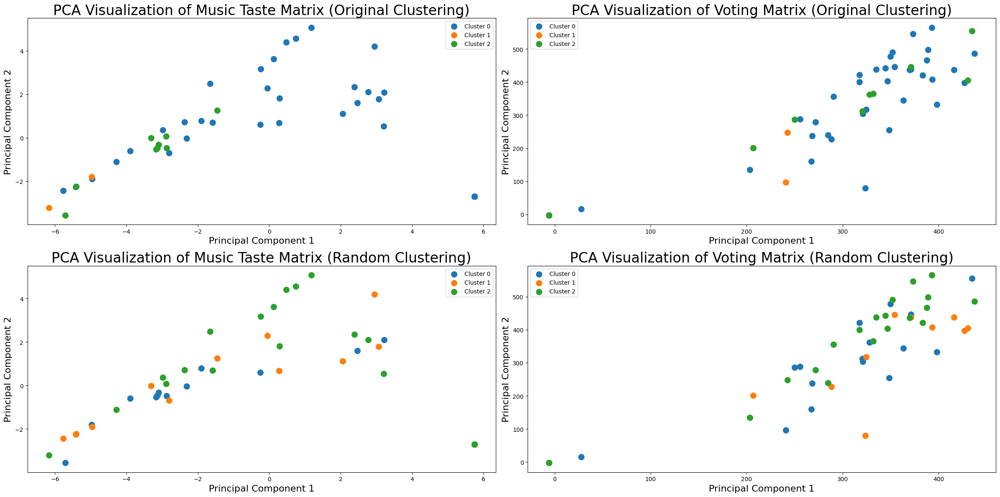

The silhouette score for Distance Matrix (Original) is: 0.13173443250188635
The silhouette score for Voting Matrix (Original) is: -0.08004182327153549
The silhouette score for Distance Matrix data (Random) is: -0.01626810712113923
The silhouette score for Voting Matrix data (Random) is: -0.026603425671370785


/Users/keyu/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_spectral.py:703: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(


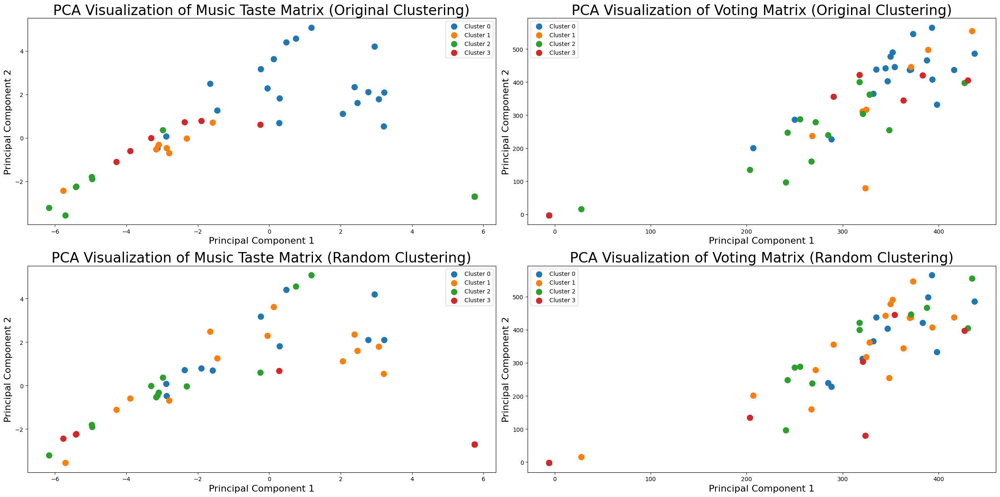

The silhouette score for Distance Matrix (Original) is: 0.14260025791484204
The silhouette score for Voting Matrix (Original) is: -0.020900896182918283
The silhouette score for Distance Matrix data (Random) is: -0.05077296952093275
The silhouette score for Voting Matrix data (Random) is: -0.05717019253980479


/Users/keyu/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_spectral.py:703: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(


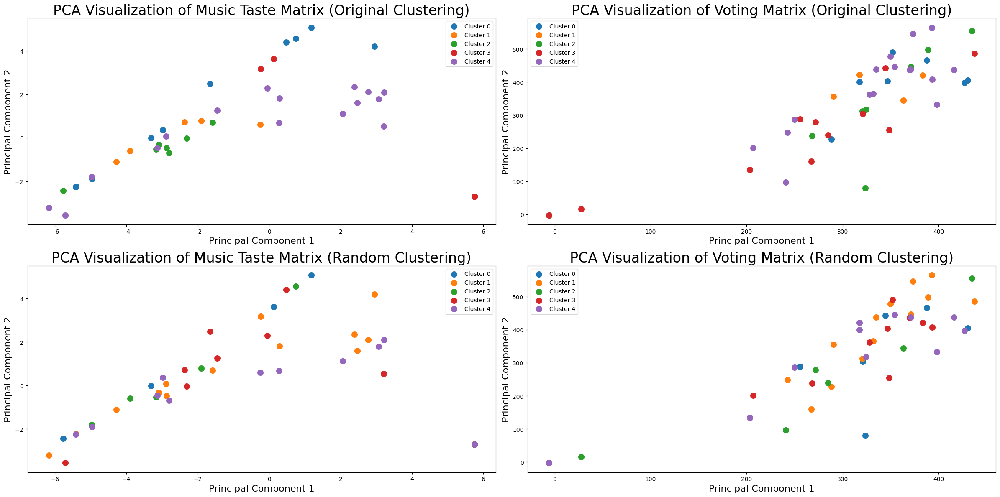

The silhouette score for Distance Matrix (Original) is: 0.17237708075528263
The silhouette score for Voting Matrix (Original) is: -0.0623537909588979
The silhouette score for Distance Matrix data (Random) is: -0.07497868376282145
The silhouette score for Voting Matrix data (Random) is: -0.06022025822991086


/Users/keyu/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_spectral.py:703: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(


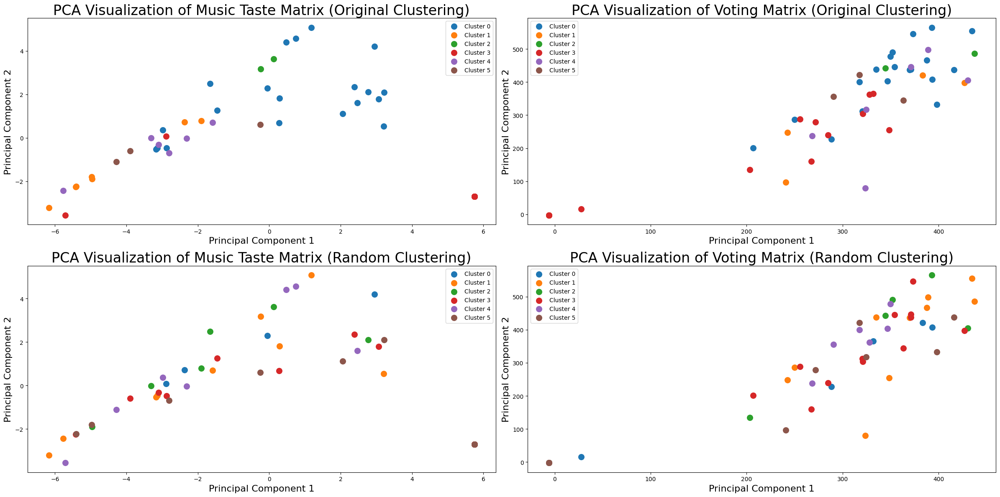

The silhouette score for Distance Matrix (Original) is: 0.19511085690248017
The silhouette score for Voting Matrix (Original) is: -0.10078760906249709
The silhouette score for Distance Matrix data (Random) is: -0.0738073174899674
The silhouette score for Voting Matrix data (Random) is: -0.07723719970919501


In [12]:
clustering_one_and_visualize_by_pca(artists_similarity_matrix, votes_matrix_jury, 3, method='KMeans')
clustering_one_and_visualize_by_pca(artists_similarity_matrix, votes_matrix_jury, 4, method='KMeans')
clustering_one_and_visualize_by_pca(artists_similarity_matrix, votes_matrix_jury, 5, method='KMeans')
clustering_one_and_visualize_by_pca(artists_similarity_matrix, votes_matrix_jury, 6, method='KMeans')

clustering_one_and_visualize_by_pca(artists_similarity_matrix, votes_matrix_jury, 3, method='SpectralClustering')
clustering_one_and_visualize_by_pca(artists_similarity_matrix, votes_matrix_jury, 4, method='SpectralClustering')
clustering_one_and_visualize_by_pca(artists_similarity_matrix, votes_matrix_jury, 5, method='SpectralClustering')
clustering_one_and_visualize_by_pca(artists_similarity_matrix, votes_matrix_jury, 6, method='SpectralClustering')

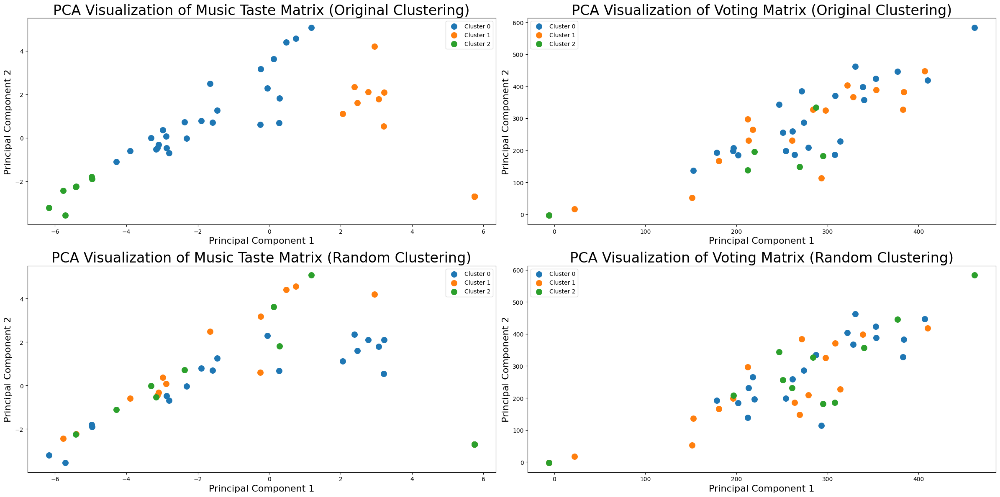

The silhouette score for Distance Matrix (Original) is: 0.21094828288866002
The silhouette score for Voting Matrix (Original) is: -0.02668577898967687
The silhouette score for Distance Matrix data (Random) is: -0.02046474635536179
The silhouette score for Voting Matrix data (Random) is: -0.01628247847331363


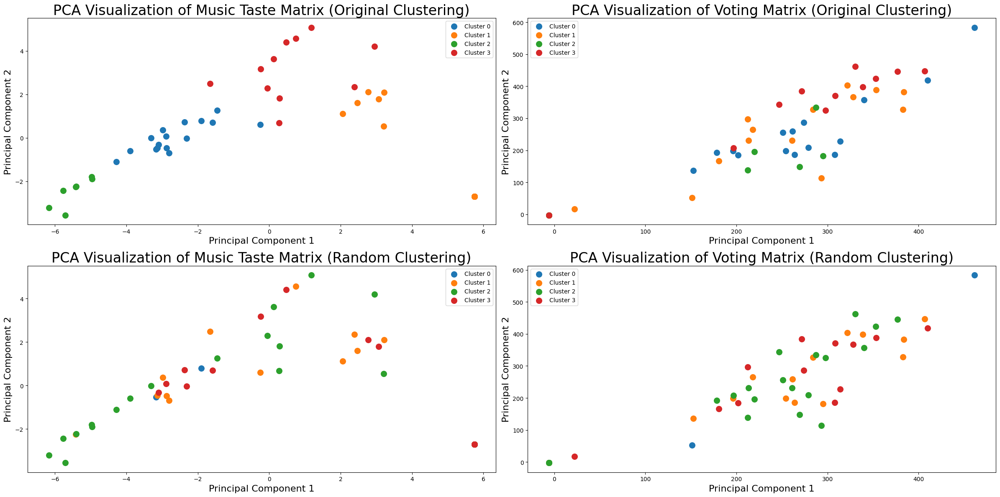

The silhouette score for Distance Matrix (Original) is: 0.20535540597417973
The silhouette score for Voting Matrix (Original) is: -0.040537700044102634
The silhouette score for Distance Matrix data (Random) is: -0.06519426580605214
The silhouette score for Voting Matrix data (Random) is: -0.06256969878571594


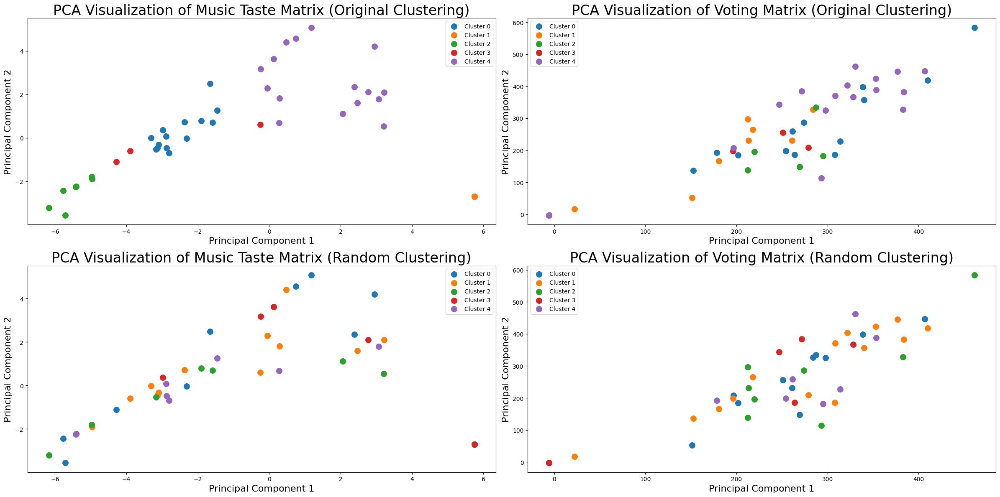

The silhouette score for Distance Matrix (Original) is: 0.28333725746742755
The silhouette score for Voting Matrix (Original) is: -0.05257350238310522
The silhouette score for Distance Matrix data (Random) is: -0.05516724097573777
The silhouette score for Voting Matrix data (Random) is: -0.093931070037656


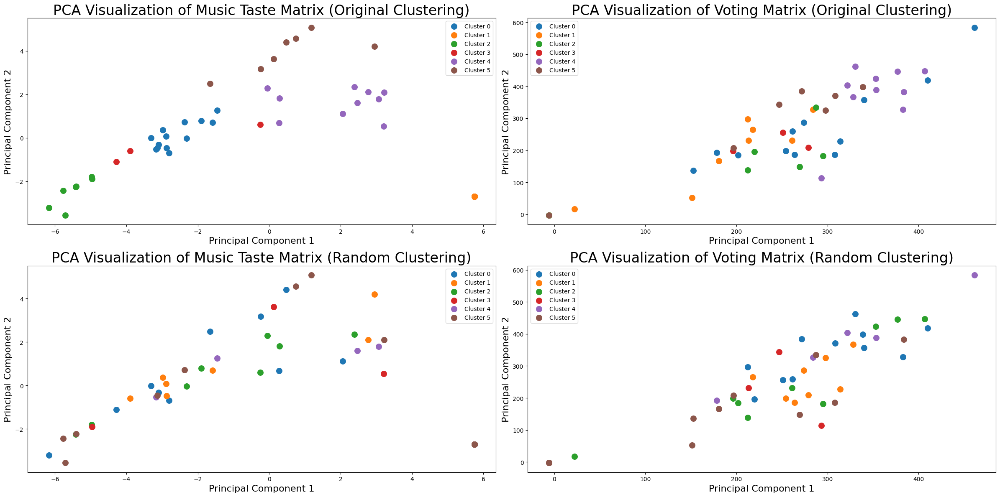

The silhouette score for Distance Matrix (Original) is: 0.29892921037985626
The silhouette score for Voting Matrix (Original) is: -0.04739321953922323
The silhouette score for Distance Matrix data (Random) is: -0.11738761249372942
The silhouette score for Voting Matrix data (Random) is: -0.08855294929304958


/Users/keyu/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_spectral.py:703: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(


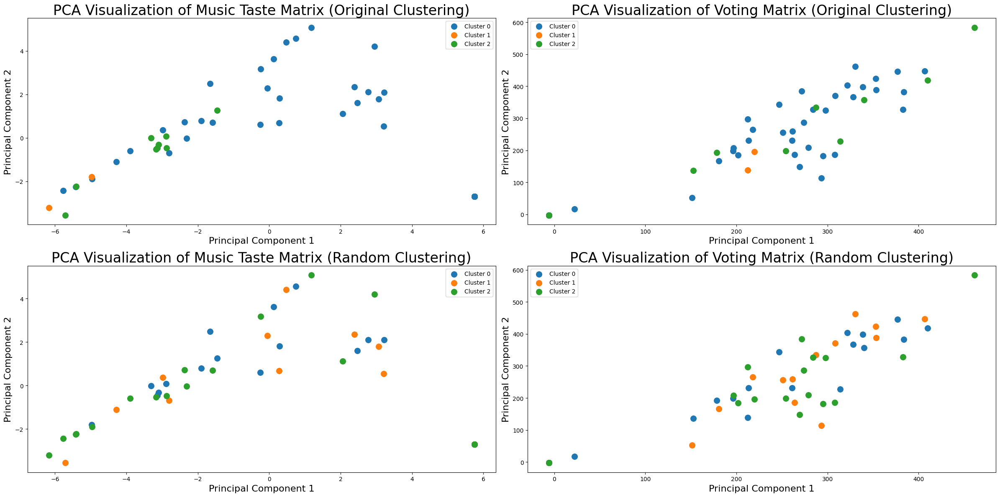

The silhouette score for Distance Matrix (Original) is: 0.13173443250188635
The silhouette score for Voting Matrix (Original) is: -0.13053570555440155
The silhouette score for Distance Matrix data (Random) is: -0.04241996295818292
The silhouette score for Voting Matrix data (Random) is: -0.028717975220836772


/Users/keyu/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_spectral.py:703: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(


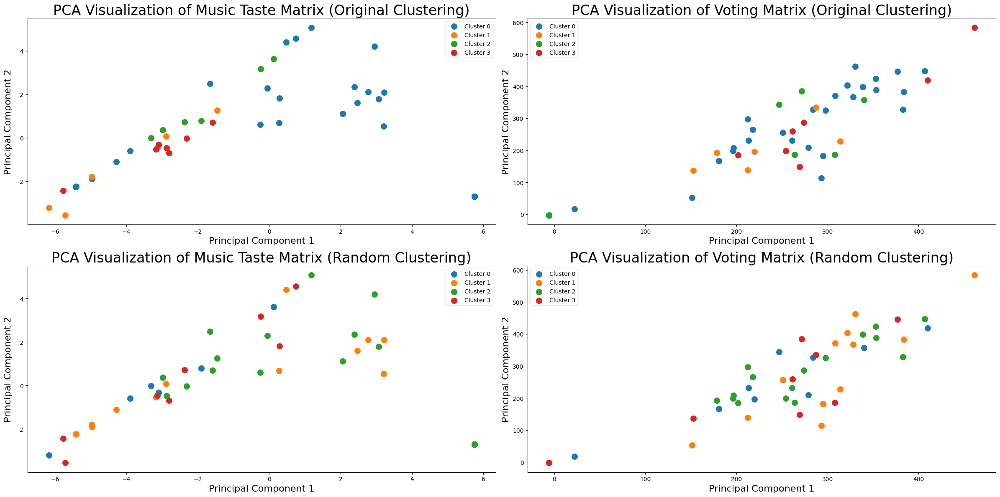

The silhouette score for Distance Matrix (Original) is: 0.10712518532872986
The silhouette score for Voting Matrix (Original) is: -0.08788780186635226
The silhouette score for Distance Matrix data (Random) is: -0.0450800085839656
The silhouette score for Voting Matrix data (Random) is: -0.05111789265957312


/Users/keyu/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_spectral.py:703: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(


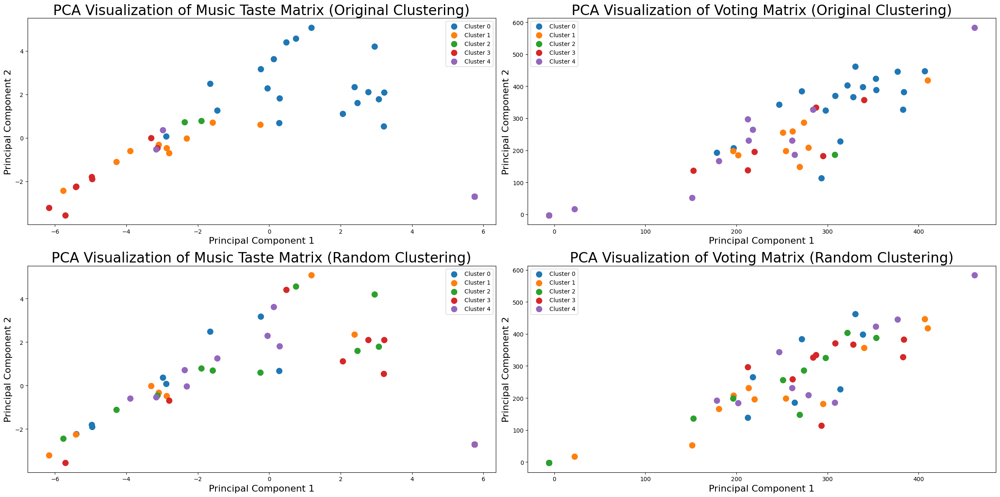

The silhouette score for Distance Matrix (Original) is: 0.2231682376943938
The silhouette score for Voting Matrix (Original) is: -0.07622515741845066
The silhouette score for Distance Matrix data (Random) is: -0.07724454584804231
The silhouette score for Voting Matrix data (Random) is: -0.06336010265831206


/Users/keyu/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_spectral.py:703: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(


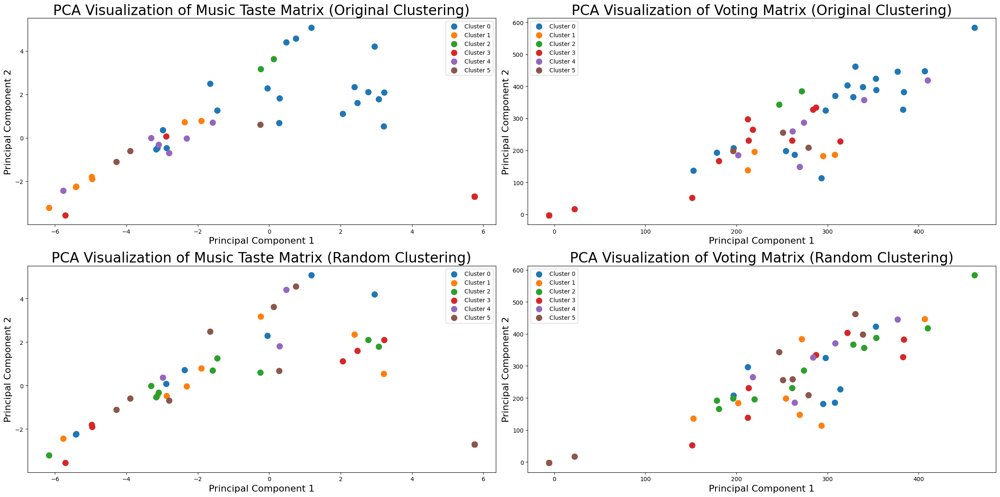

The silhouette score for Distance Matrix (Original) is: 0.19511085690248017
The silhouette score for Voting Matrix (Original) is: -0.09983406968890413
The silhouette score for Distance Matrix data (Random) is: -0.09844539311082089
The silhouette score for Voting Matrix data (Random) is: -0.06367824212393465


In [13]:
clustering_one_and_visualize_by_pca(artists_similarity_matrix, votes_matrix_tele, 3, method='KMeans')
clustering_one_and_visualize_by_pca(artists_similarity_matrix, votes_matrix_tele, 4, method='KMeans')
clustering_one_and_visualize_by_pca(artists_similarity_matrix, votes_matrix_tele, 5, method='KMeans')
clustering_one_and_visualize_by_pca(artists_similarity_matrix, votes_matrix_tele, 6, method='KMeans')

clustering_one_and_visualize_by_pca(artists_similarity_matrix, votes_matrix_tele, 3, method='SpectralClustering')
clustering_one_and_visualize_by_pca(artists_similarity_matrix, votes_matrix_tele, 4, method='SpectralClustering')
clustering_one_and_visualize_by_pca(artists_similarity_matrix, votes_matrix_tele, 5, method='SpectralClustering')
clustering_one_and_visualize_by_pca(artists_similarity_matrix, votes_matrix_tele, 6, method='SpectralClustering')

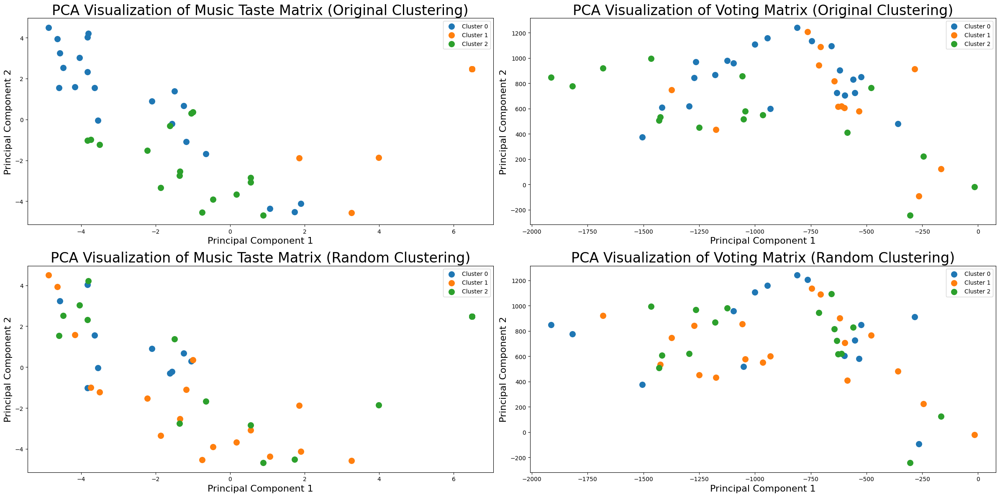

The silhouette score for Distance Matrix (Original) is: 0.27343912346199784
The silhouette score for Voting Matrix (Original) is: -0.01547402498638839
The silhouette score for Distance Matrix data (Random) is: -0.033527293358886656
The silhouette score for Voting Matrix data (Random) is: -0.031618337793854874


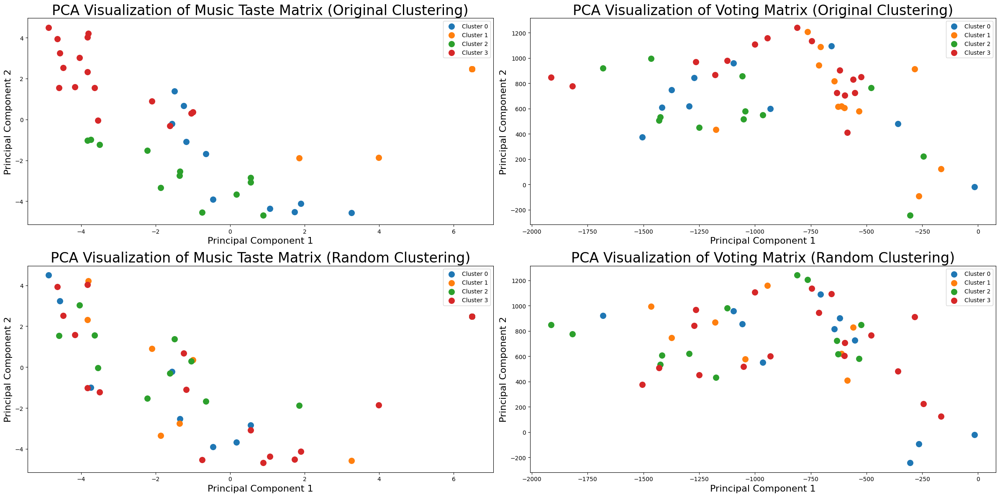

The silhouette score for Distance Matrix (Original) is: 0.3203752068939478
The silhouette score for Voting Matrix (Original) is: -0.04413184626820688
The silhouette score for Distance Matrix data (Random) is: -0.0692047194522263
The silhouette score for Voting Matrix data (Random) is: -0.055811694916242376


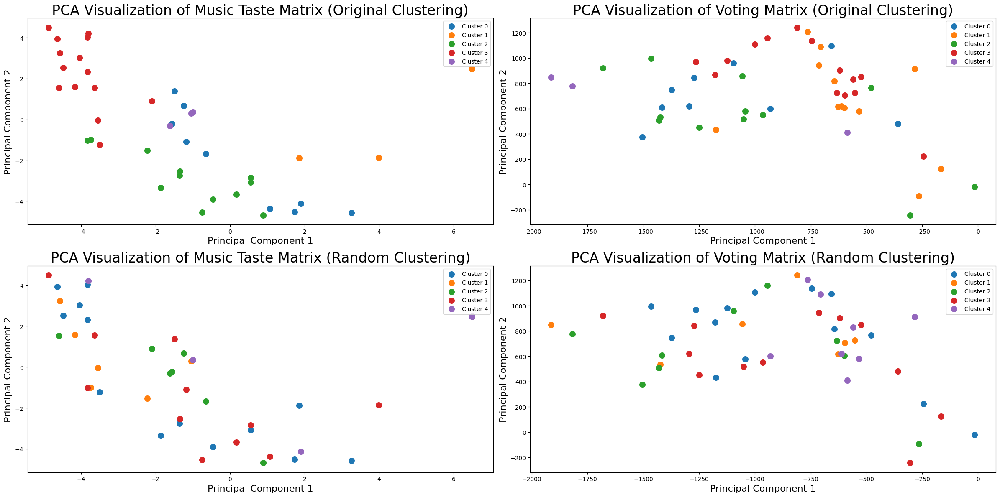

The silhouette score for Distance Matrix (Original) is: 0.3399109489774598
The silhouette score for Voting Matrix (Original) is: -0.06359787298613372
The silhouette score for Distance Matrix data (Random) is: -0.07457269643136402
The silhouette score for Voting Matrix data (Random) is: -0.10730099736397547


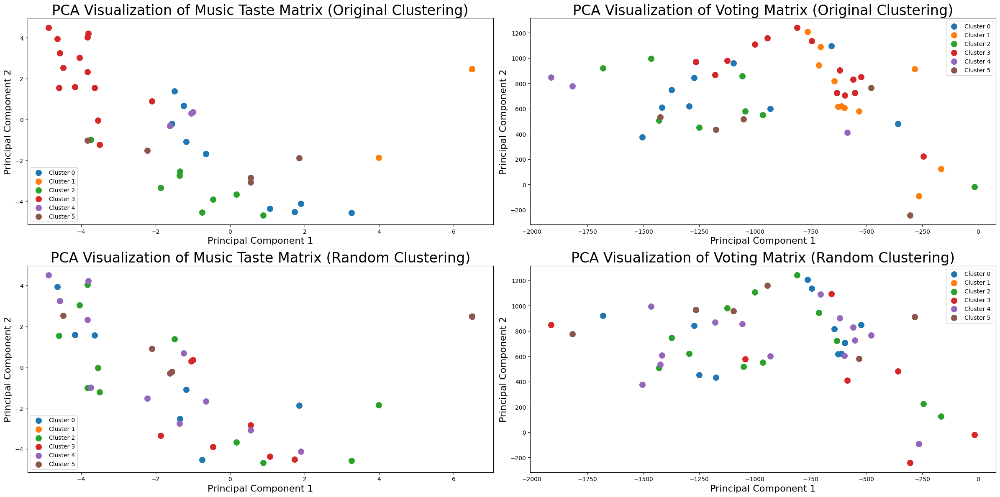

The silhouette score for Distance Matrix (Original) is: 0.3177506662858891
The silhouette score for Voting Matrix (Original) is: -0.07141513847264015
The silhouette score for Distance Matrix data (Random) is: -0.08132464831496142
The silhouette score for Voting Matrix data (Random) is: -0.06782293474526649


/Users/keyu/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_spectral.py:703: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(
/Users/keyu/Library/Python/3.9/lib/python/site-packages/sklearn/manifold/_spectral_embedding.py:455: UserWarning: Exited at iteration 2000 with accuracies 
[1.53575940e-13 1.17410682e-07 4.42877625e-08 2.50311259e-05]
not reaching the requested tolerance 7.450580596923828e-07.
Use iteration 1714 instead with accuracy 
2.1051704250273214e-06.

  _, diffusion_map = lobpcg(
/Users/keyu/Library/Python/3.9/lib/python/site-packages/sklearn/manifold/_spectral_embedding.py:455: UserWarning: Exited postprocessing with accuracies 
[2.53386652e-14 1.17510520e-07 4.27554460e-08 8.26041549e-06]
not reaching the requested tolerance 7.450580596923828e-07.
  _, diffusion_map = lobpcg(


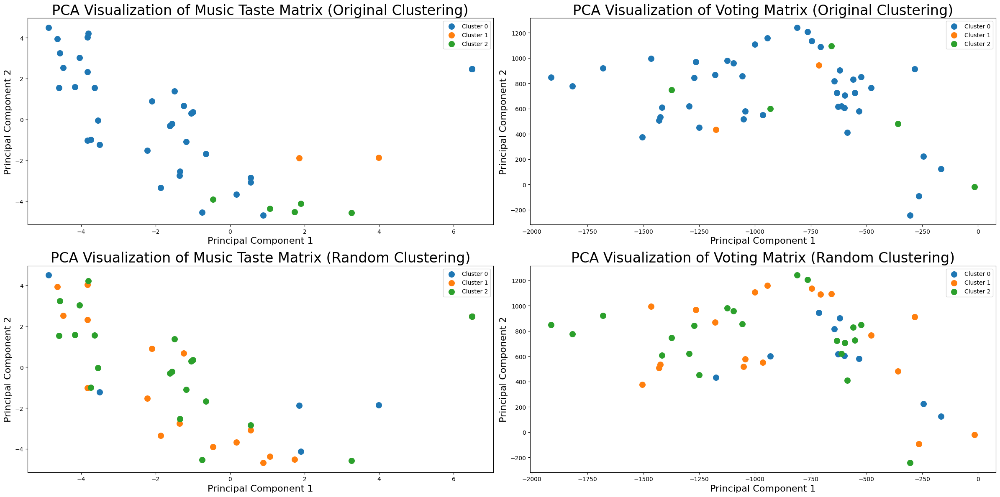

The silhouette score for Distance Matrix (Original) is: 0.09894566771759679
The silhouette score for Voting Matrix (Original) is: -0.06603391701314541
The silhouette score for Distance Matrix data (Random) is: -0.018763436869000987
The silhouette score for Voting Matrix data (Random) is: -0.06498933861129806


/Users/keyu/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_spectral.py:703: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(


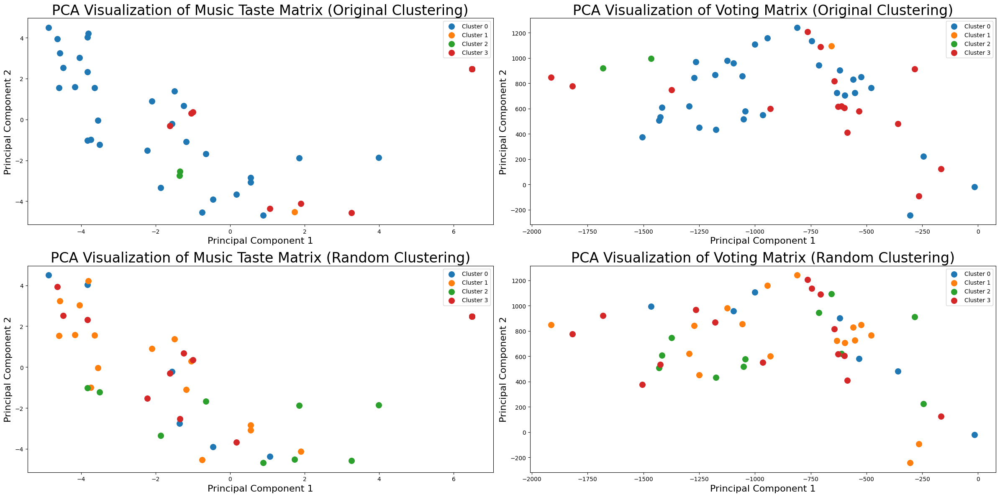

The silhouette score for Distance Matrix (Original) is: 0.16070419254348547
The silhouette score for Voting Matrix (Original) is: -0.17748496093105653
The silhouette score for Distance Matrix data (Random) is: -0.0373851496453949
The silhouette score for Voting Matrix data (Random) is: -0.06572174023485564


/Users/keyu/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_spectral.py:703: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(


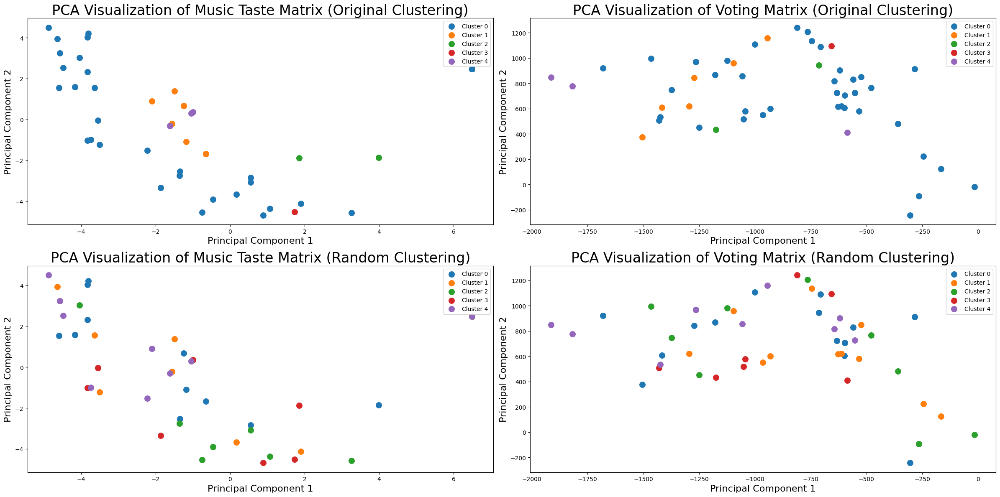

The silhouette score for Distance Matrix (Original) is: 0.05402981734882715
The silhouette score for Voting Matrix (Original) is: -0.2091916033269911
The silhouette score for Distance Matrix data (Random) is: -0.07917301953049162
The silhouette score for Voting Matrix data (Random) is: -0.08305285413040521


/Users/keyu/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_spectral.py:703: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(


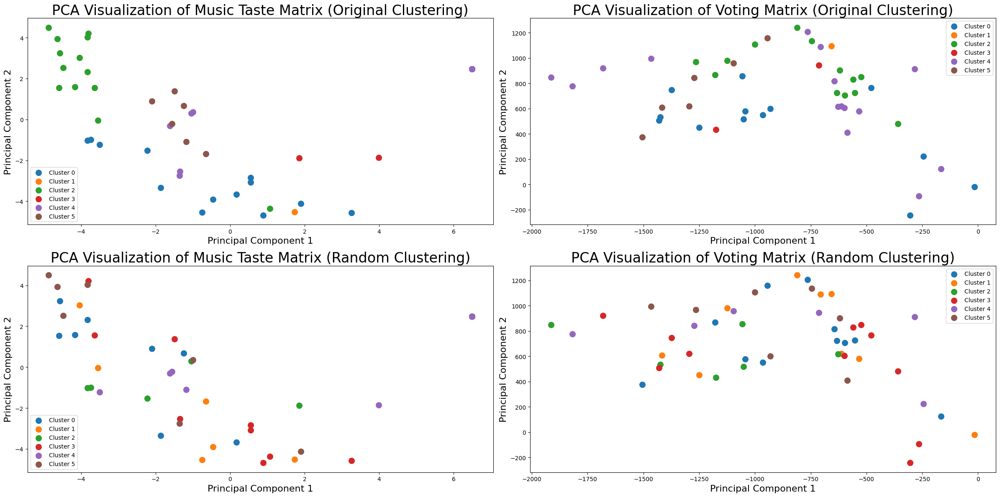

The silhouette score for Distance Matrix (Original) is: 0.23544784408658118
The silhouette score for Voting Matrix (Original) is: -0.18163105831254162
The silhouette score for Distance Matrix data (Random) is: -0.09344201812683028
The silhouette score for Voting Matrix data (Random) is: -0.0939165573010076


In [14]:
clustering_one_and_visualize_by_pca(genres_similarity_matrix, votes_matrix_total, 3, method='KMeans')
clustering_one_and_visualize_by_pca(genres_similarity_matrix, votes_matrix_total, 4, method='KMeans')
clustering_one_and_visualize_by_pca(genres_similarity_matrix, votes_matrix_total, 5, method='KMeans')
clustering_one_and_visualize_by_pca(genres_similarity_matrix, votes_matrix_total, 6, method='KMeans')

clustering_one_and_visualize_by_pca(genres_similarity_matrix, votes_matrix_total, 3, method='SpectralClustering')
clustering_one_and_visualize_by_pca(genres_similarity_matrix, votes_matrix_total, 4, method='SpectralClustering')
clustering_one_and_visualize_by_pca(genres_similarity_matrix, votes_matrix_total, 5, method='SpectralClustering')
clustering_one_and_visualize_by_pca(genres_similarity_matrix, votes_matrix_total, 6, method='SpectralClustering')

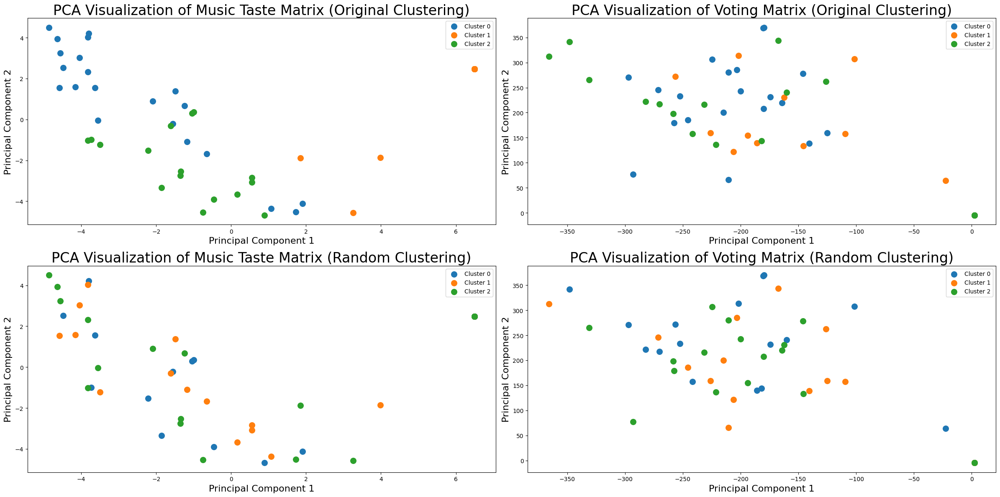

The silhouette score for Distance Matrix (Original) is: 0.27343912346199784
The silhouette score for Voting Matrix (Original) is: -0.024301368351392422
The silhouette score for Distance Matrix data (Random) is: -0.03271319253250579
The silhouette score for Voting Matrix data (Random) is: -0.02646636420966764


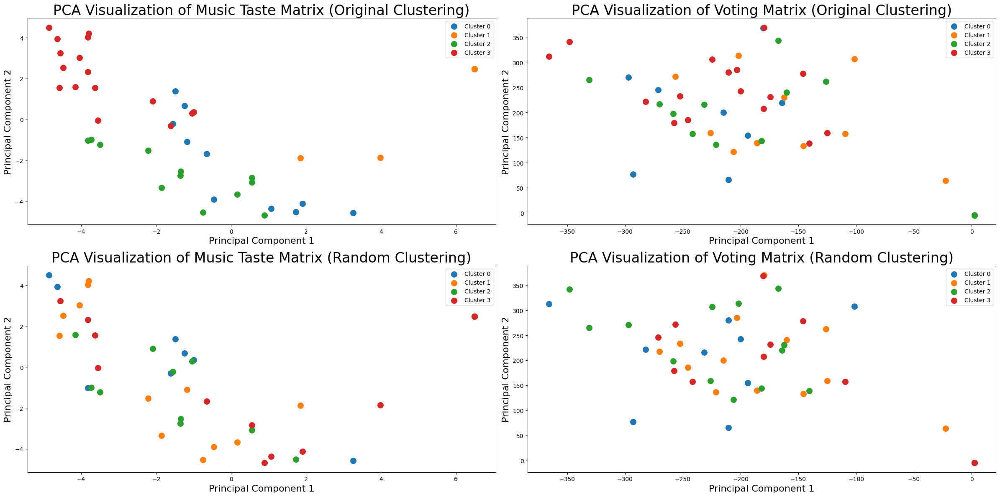

The silhouette score for Distance Matrix (Original) is: 0.3203752068939478
The silhouette score for Voting Matrix (Original) is: -0.036985969946301336
The silhouette score for Distance Matrix data (Random) is: -0.031248820708716443
The silhouette score for Voting Matrix data (Random) is: -0.04951050293684875


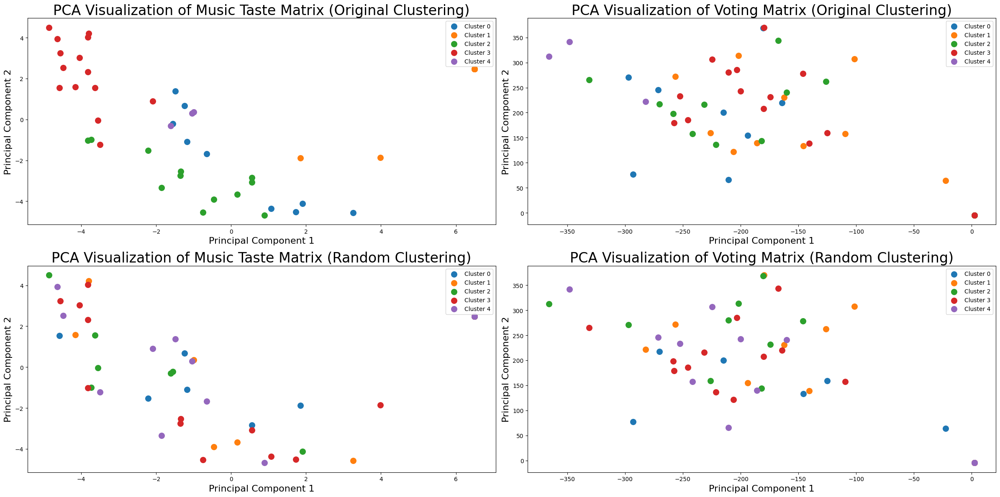

The silhouette score for Distance Matrix (Original) is: 0.3399109489774598
The silhouette score for Voting Matrix (Original) is: -0.046015109964091166
The silhouette score for Distance Matrix data (Random) is: -0.07460040189378715
The silhouette score for Voting Matrix data (Random) is: -0.07570381270332345


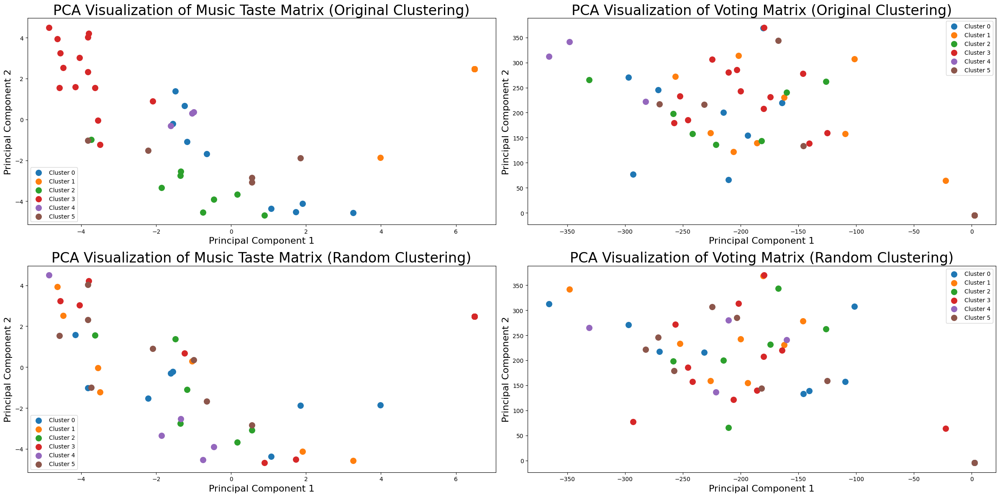

The silhouette score for Distance Matrix (Original) is: 0.3177506662858891
The silhouette score for Voting Matrix (Original) is: -0.06970794899617334
The silhouette score for Distance Matrix data (Random) is: -0.08925288545729497
The silhouette score for Voting Matrix data (Random) is: -0.07468791682694581


/Users/keyu/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_spectral.py:703: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(
/Users/keyu/Library/Python/3.9/lib/python/site-packages/sklearn/manifold/_spectral_embedding.py:455: UserWarning: Exited at iteration 2000 with accuracies 
[1.53575940e-13 1.17410682e-07 4.42877625e-08 2.50311259e-05]
not reaching the requested tolerance 7.450580596923828e-07.
Use iteration 1714 instead with accuracy 
2.1051704250273214e-06.

  _, diffusion_map = lobpcg(
/Users/keyu/Library/Python/3.9/lib/python/site-packages/sklearn/manifold/_spectral_embedding.py:455: UserWarning: Exited postprocessing with accuracies 
[2.53386652e-14 1.17510520e-07 4.27554460e-08 8.26041549e-06]
not reaching the requested tolerance 7.450580596923828e-07.
  _, diffusion_map = lobpcg(


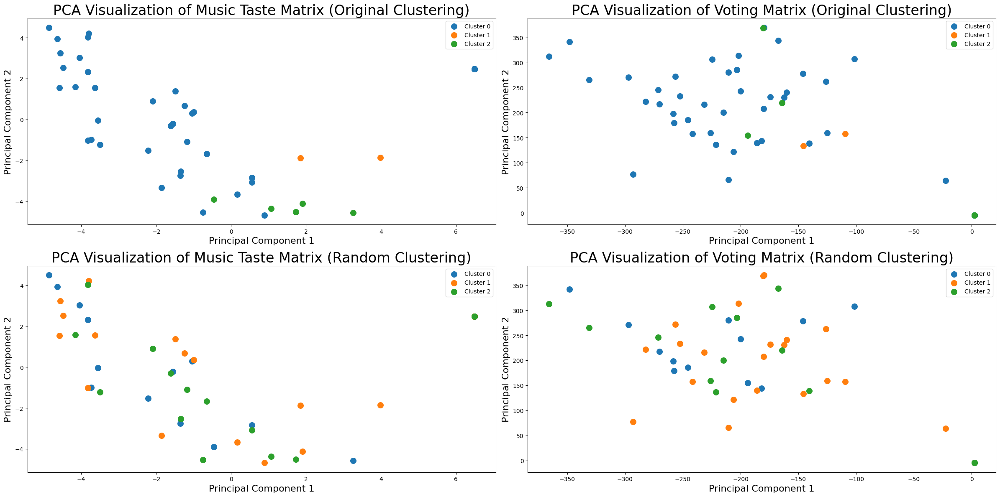

The silhouette score for Distance Matrix (Original) is: 0.09894566771759679
The silhouette score for Voting Matrix (Original) is: -0.10933257568141093
The silhouette score for Distance Matrix data (Random) is: -0.01578152852059446
The silhouette score for Voting Matrix data (Random) is: -0.01807817331784407


/Users/keyu/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_spectral.py:703: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(


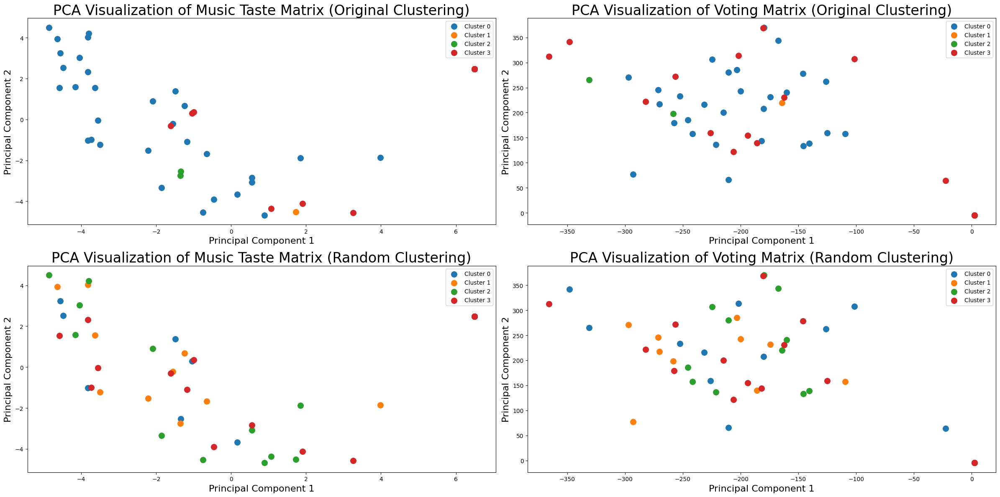

The silhouette score for Distance Matrix (Original) is: 0.16070419254348547
The silhouette score for Voting Matrix (Original) is: -0.16311001806429407
The silhouette score for Distance Matrix data (Random) is: -0.06092941048113449
The silhouette score for Voting Matrix data (Random) is: -0.049880762086123374


/Users/keyu/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_spectral.py:703: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(


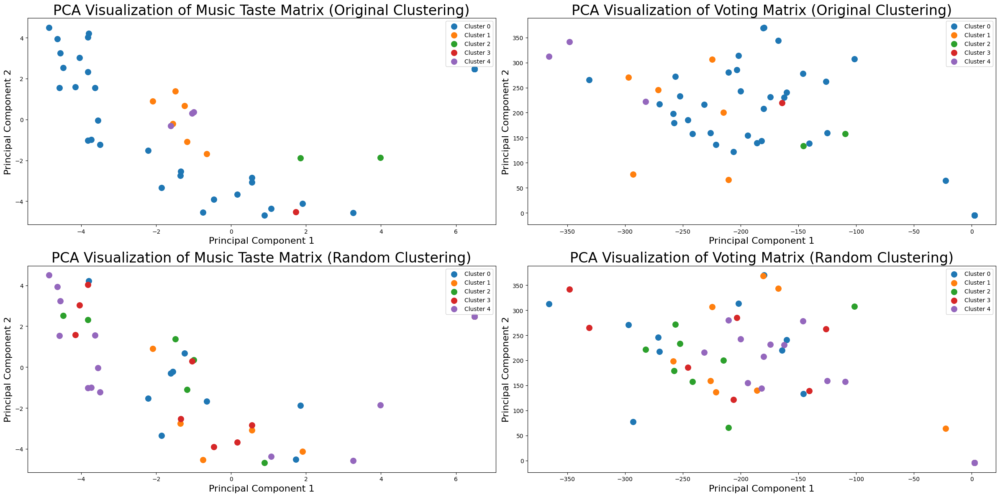

The silhouette score for Distance Matrix (Original) is: 0.05402981734882715
The silhouette score for Voting Matrix (Original) is: -0.1480600650926881
The silhouette score for Distance Matrix data (Random) is: -0.08706466331432586
The silhouette score for Voting Matrix data (Random) is: -0.0645485485103467


/Users/keyu/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_spectral.py:703: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(


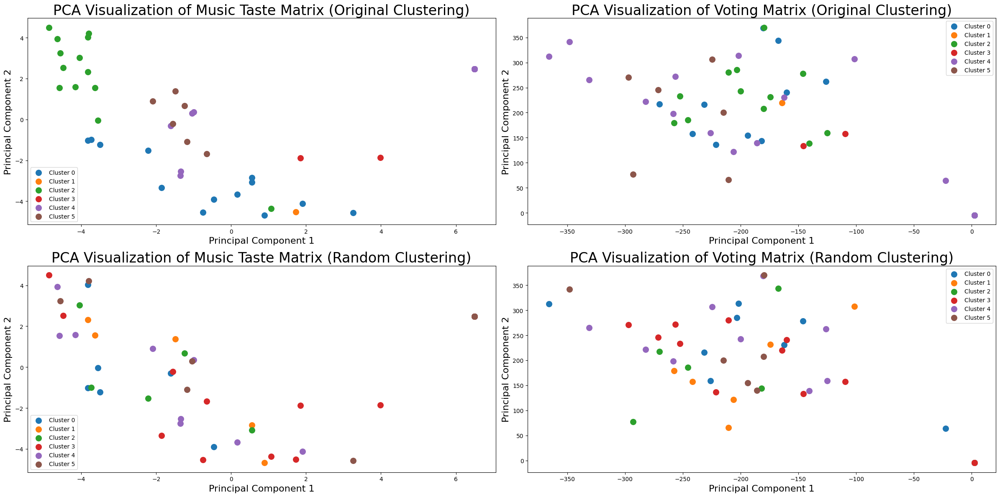

The silhouette score for Distance Matrix (Original) is: 0.23544784408658118
The silhouette score for Voting Matrix (Original) is: -0.15855417033257016
The silhouette score for Distance Matrix data (Random) is: -0.08821666805004201
The silhouette score for Voting Matrix data (Random) is: -0.05522706184743858


In [15]:
clustering_one_and_visualize_by_pca(genres_similarity_matrix, votes_matrix_tele, 3, method='KMeans')
clustering_one_and_visualize_by_pca(genres_similarity_matrix, votes_matrix_tele, 4, method='KMeans')
clustering_one_and_visualize_by_pca(genres_similarity_matrix, votes_matrix_tele, 5, method='KMeans')
clustering_one_and_visualize_by_pca(genres_similarity_matrix, votes_matrix_tele, 6, method='KMeans')

clustering_one_and_visualize_by_pca(genres_similarity_matrix, votes_matrix_tele, 3, method='SpectralClustering')
clustering_one_and_visualize_by_pca(genres_similarity_matrix, votes_matrix_tele, 4, method='SpectralClustering')
clustering_one_and_visualize_by_pca(genres_similarity_matrix, votes_matrix_tele, 5, method='SpectralClustering')
clustering_one_and_visualize_by_pca(genres_similarity_matrix, votes_matrix_tele, 6, method='SpectralClustering')

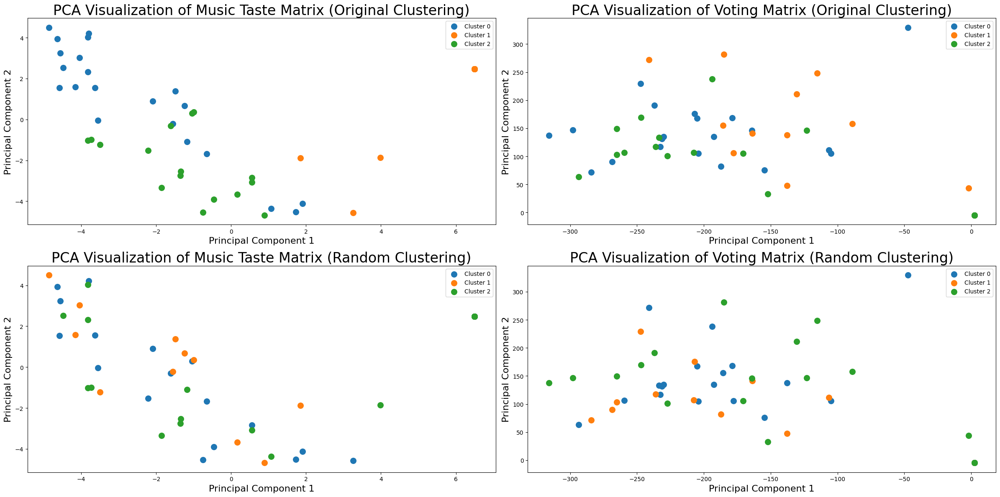

The silhouette score for Distance Matrix (Original) is: 0.27343912346199784
The silhouette score for Voting Matrix (Original) is: -0.0162914134437871
The silhouette score for Distance Matrix data (Random) is: -0.044124966110740134
The silhouette score for Voting Matrix data (Random) is: -0.03420730858611607


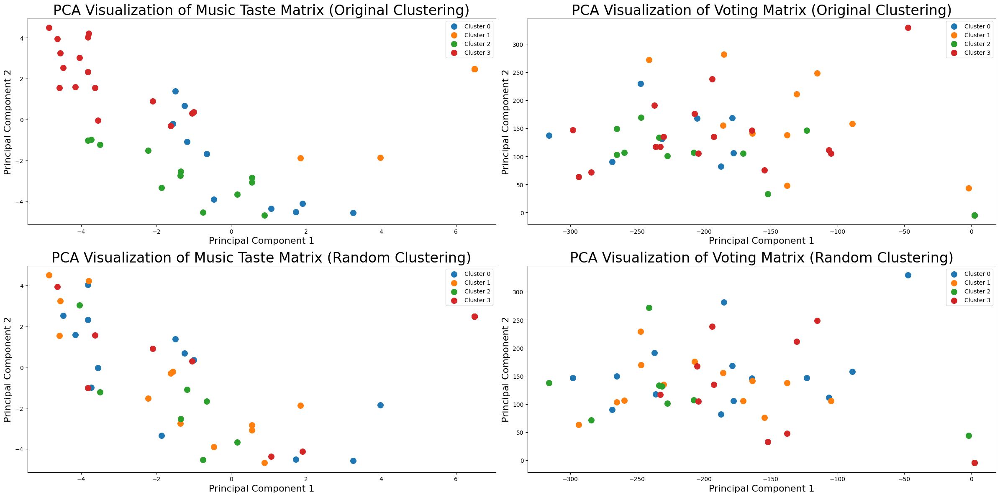

The silhouette score for Distance Matrix (Original) is: 0.3203752068939478
The silhouette score for Voting Matrix (Original) is: -0.03901030040899128
The silhouette score for Distance Matrix data (Random) is: -0.05701181169723408
The silhouette score for Voting Matrix data (Random) is: -0.042599774998592174


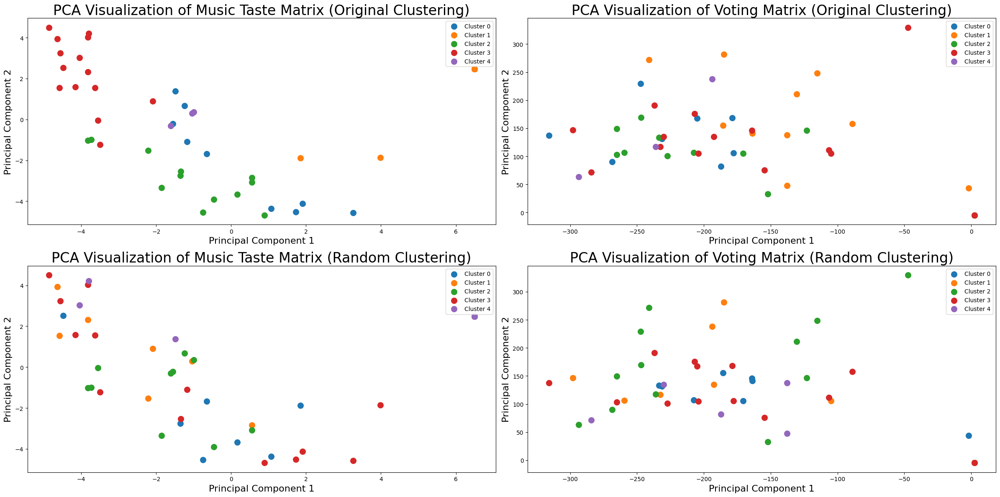

The silhouette score for Distance Matrix (Original) is: 0.3399109489774598
The silhouette score for Voting Matrix (Original) is: -0.053542774094768576
The silhouette score for Distance Matrix data (Random) is: -0.09718186057894673
The silhouette score for Voting Matrix data (Random) is: -0.08491315085839245


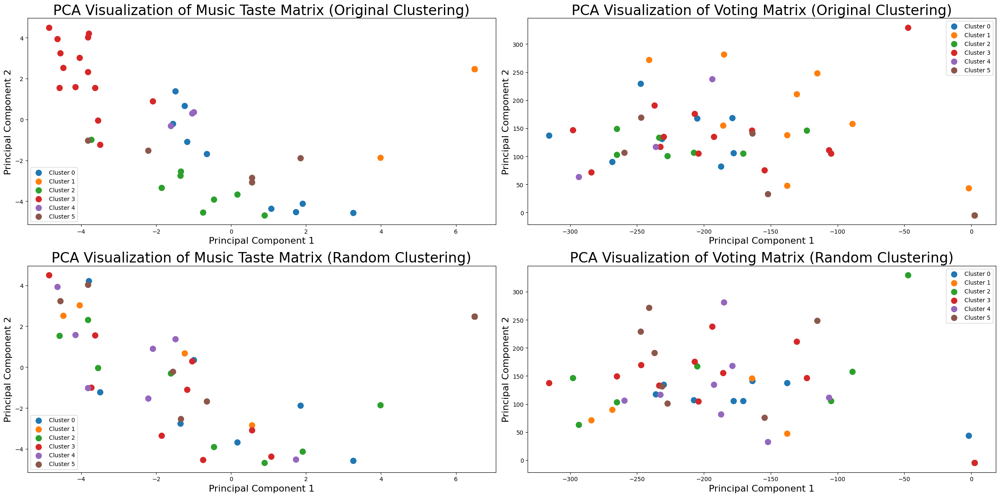

The silhouette score for Distance Matrix (Original) is: 0.3177506662858891
The silhouette score for Voting Matrix (Original) is: -0.06262385487787843
The silhouette score for Distance Matrix data (Random) is: -0.10718882706344962
The silhouette score for Voting Matrix data (Random) is: -0.08924579618114269


/Users/keyu/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_spectral.py:703: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(
/Users/keyu/Library/Python/3.9/lib/python/site-packages/sklearn/manifold/_spectral_embedding.py:455: UserWarning: Exited at iteration 2000 with accuracies 
[1.53575940e-13 1.17410682e-07 4.42877625e-08 2.50311259e-05]
not reaching the requested tolerance 7.450580596923828e-07.
Use iteration 1714 instead with accuracy 
2.1051704250273214e-06.

  _, diffusion_map = lobpcg(
/Users/keyu/Library/Python/3.9/lib/python/site-packages/sklearn/manifold/_spectral_embedding.py:455: UserWarning: Exited postprocessing with accuracies 
[2.53386652e-14 1.17510520e-07 4.27554460e-08 8.26041549e-06]
not reaching the requested tolerance 7.450580596923828e-07.
  _, diffusion_map = lobpcg(


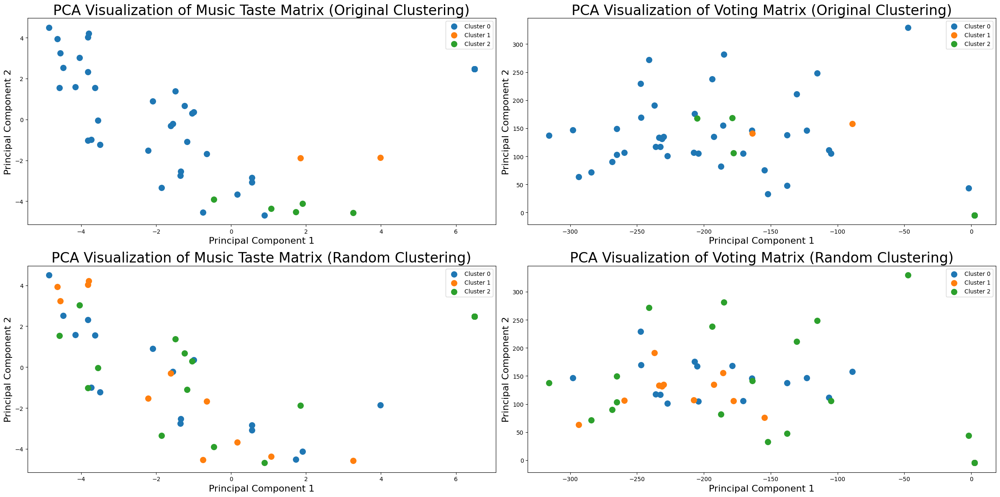

The silhouette score for Distance Matrix (Original) is: 0.09894566771759679
The silhouette score for Voting Matrix (Original) is: -0.029923079493397228
The silhouette score for Distance Matrix data (Random) is: -0.011388762111037488
The silhouette score for Voting Matrix data (Random) is: -0.03834884084508439


/Users/keyu/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_spectral.py:703: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(


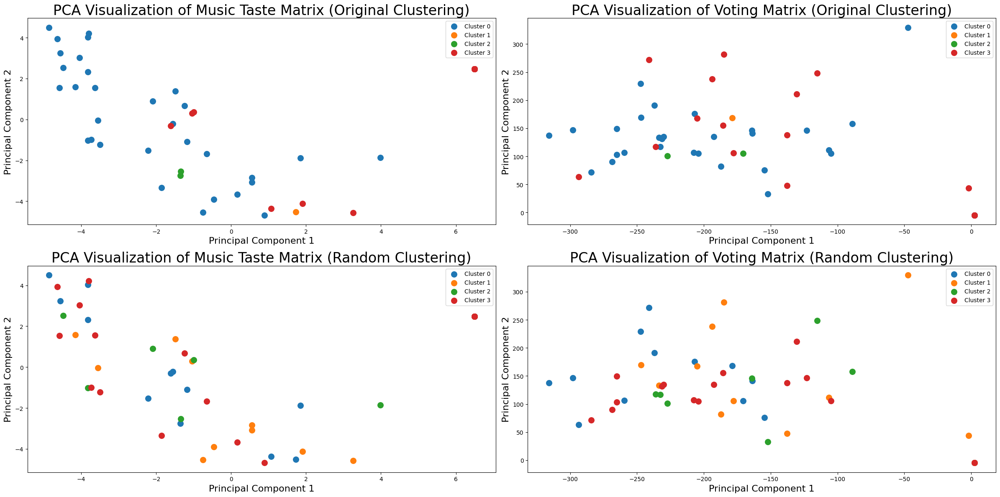

The silhouette score for Distance Matrix (Original) is: 0.16070419254348547
The silhouette score for Voting Matrix (Original) is: -0.13177954791723537
The silhouette score for Distance Matrix data (Random) is: -0.06389240475963005
The silhouette score for Voting Matrix data (Random) is: -0.04299403876130558


/Users/keyu/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_spectral.py:703: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(


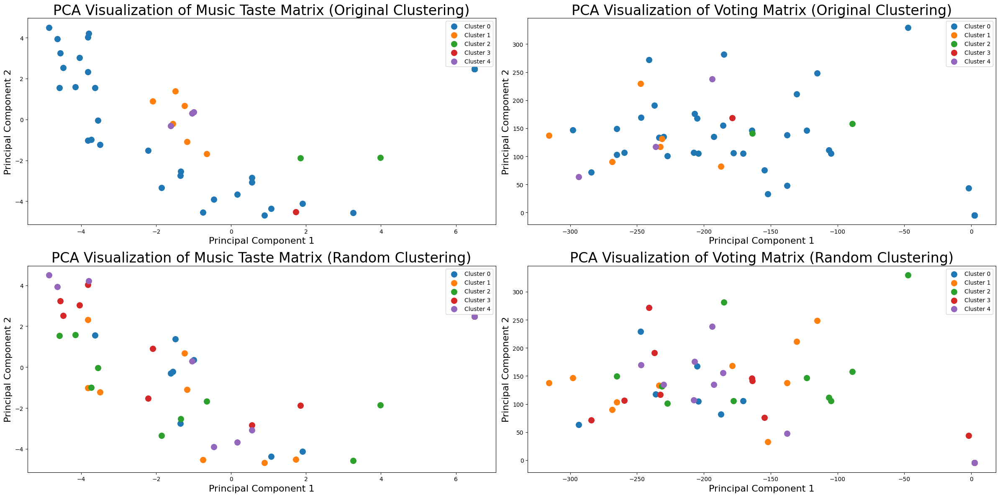

The silhouette score for Distance Matrix (Original) is: 0.05402981734882715
The silhouette score for Voting Matrix (Original) is: -0.1419804426821549
The silhouette score for Distance Matrix data (Random) is: -0.07502981063453017
The silhouette score for Voting Matrix data (Random) is: -0.052017879600576605


/Users/keyu/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_spectral.py:703: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(


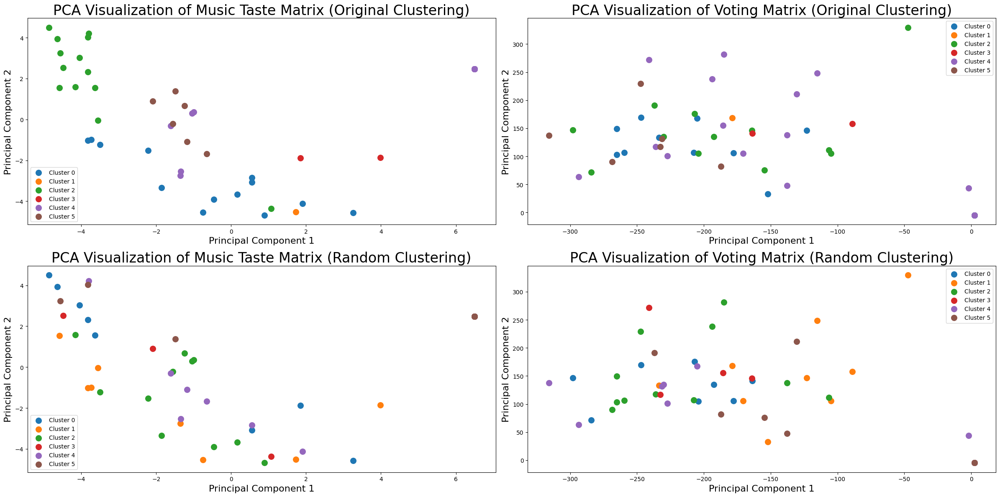

The silhouette score for Distance Matrix (Original) is: 0.23544784408658118
The silhouette score for Voting Matrix (Original) is: -0.15181183081678215
The silhouette score for Distance Matrix data (Random) is: -0.11859428876311132
The silhouette score for Voting Matrix data (Random) is: -0.08342946433647597


In [16]:
clustering_one_and_visualize_by_pca(genres_similarity_matrix, votes_matrix_jury, 3, method='KMeans')
clustering_one_and_visualize_by_pca(genres_similarity_matrix, votes_matrix_jury, 4, method='KMeans')
clustering_one_and_visualize_by_pca(genres_similarity_matrix, votes_matrix_jury, 5, method='KMeans')
clustering_one_and_visualize_by_pca(genres_similarity_matrix, votes_matrix_jury, 6, method='KMeans')

clustering_one_and_visualize_by_pca(genres_similarity_matrix, votes_matrix_jury, 3, method='SpectralClustering')
clustering_one_and_visualize_by_pca(genres_similarity_matrix, votes_matrix_jury, 4, method='SpectralClustering')
clustering_one_and_visualize_by_pca(genres_similarity_matrix, votes_matrix_jury, 5, method='SpectralClustering')
clustering_one_and_visualize_by_pca(genres_similarity_matrix, votes_matrix_jury, 6, method='SpectralClustering')